# Visualization of the data preprocessing

This notebook aims to show case the different data preprocessing steps. To this end, we first will assess the segmentation quality of the applied UNet model and then visualize the heterogeneity in the nucelar phenotypes by looking at some montages of those.

---

## 0. Environmental setup

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import label2rgb
from skimage.io import imread
import os
import matplotlib as mpl

mpl.rcParams["figure.dpi"] = 600

seed = 1234

%load_ext nb_black

<IPython.core.display.Javascript object>

---

## 1. Read in data

We will now read in the metadata file that provides information regarding the origin of individual nuclei and the associated conditions they come from. Importantly, this also incldues a list of the FoV images which we will first assess with respect to the quality of the nuclei segmentation.

In [4]:
md = pd.read_csv(
    "../../../../../data/experiments/rohban/images/preprocessing/full_pipeline/padded_nuclei_metadata.csv.gz",
    index_col=0,
)

<IPython.core.display.Javascript object>

In [6]:
md.columns

Index(['plate', 'well', 'image_file', 'gene_id', 'gene_symbol', 'is_landmark',
       'allele', 'expr_vec', 'toxicity', 'ie_blast', 'intended_orf_mismatch',
       'open_closed', 'rnai_plate', 'site', 'type', 'virus_vol', 'timepoint',
       'assay_well_role', 'bb_width', 'bb_height', 'minor_axis_length',
       'major_axis_length', 'aspect_ratio', 'aspect_ratio_cluster',
       'nuclei_count_image', 'slide_image_name', 'aspect_ratio_cluster_ratio',
       'centroid_0', 'centroid_1', 'allele_symbol'],
      dtype='object')

<IPython.core.display.Javascript object>

---

## 2. Visualization of the segmentation results

To visualize the quality of the UNet-based nuclei segmentation we will randomly sample one image for 6 randomly sampled gene targets.

In [71]:
selected_targets = ["JUN", "MAP3K9", "AKT2", "JAK2", "NFKBIB", "EMPTY"]

<IPython.core.display.Javascript object>

In [93]:
np.random.seed(seed)
image_files = []
for target in selected_targets:
    print(target)
    image_file = np.random.choice(
        md.loc[md.gene_symbol == target, "slide_image_name"], size=1
    )[0]
    image_file = os.path.join(
        str(np.unique(md.loc[md.slide_image_name == image_file, "plate"])[0]),
        image_file,
    )
    image_files.append(image_file)

JUN
MAP3K9
AKT2
JAK2
NFKBIB
EMPTY


<IPython.core.display.Javascript object>

We now load the selected raw images and their corresponding segmentation masks into memory.

In [99]:
images = []
masks = []

root_image_dir = "../../../../../data/experiments/rohban/images/preprocessing/full_pipeline/filtered"
root_mask_dir = "../../../../../data/resources/images/rohban/unet_masks"

for image_file in image_files:
    image = imread(os.path.join(root_image_dir, image_file))
    low = np.percentile(image, 1)
    high = np.percentile(image, 99.9)
    image = image - low
    image = image / (high - low)
    image = np.clip(image * 255.0, 0, 255).astype(np.uint8)
    images.append(image)
    masks.append(imread(os.path.join(root_mask_dir, image_file)))

<IPython.core.display.Javascript object>

In [100]:
label_rgbs = []
for i in range(len(images)):
    label_rgbs.append(label2rgb(label=masks[i], image=images[i], bg_label=0, alpha=0.2))

<IPython.core.display.Javascript object>

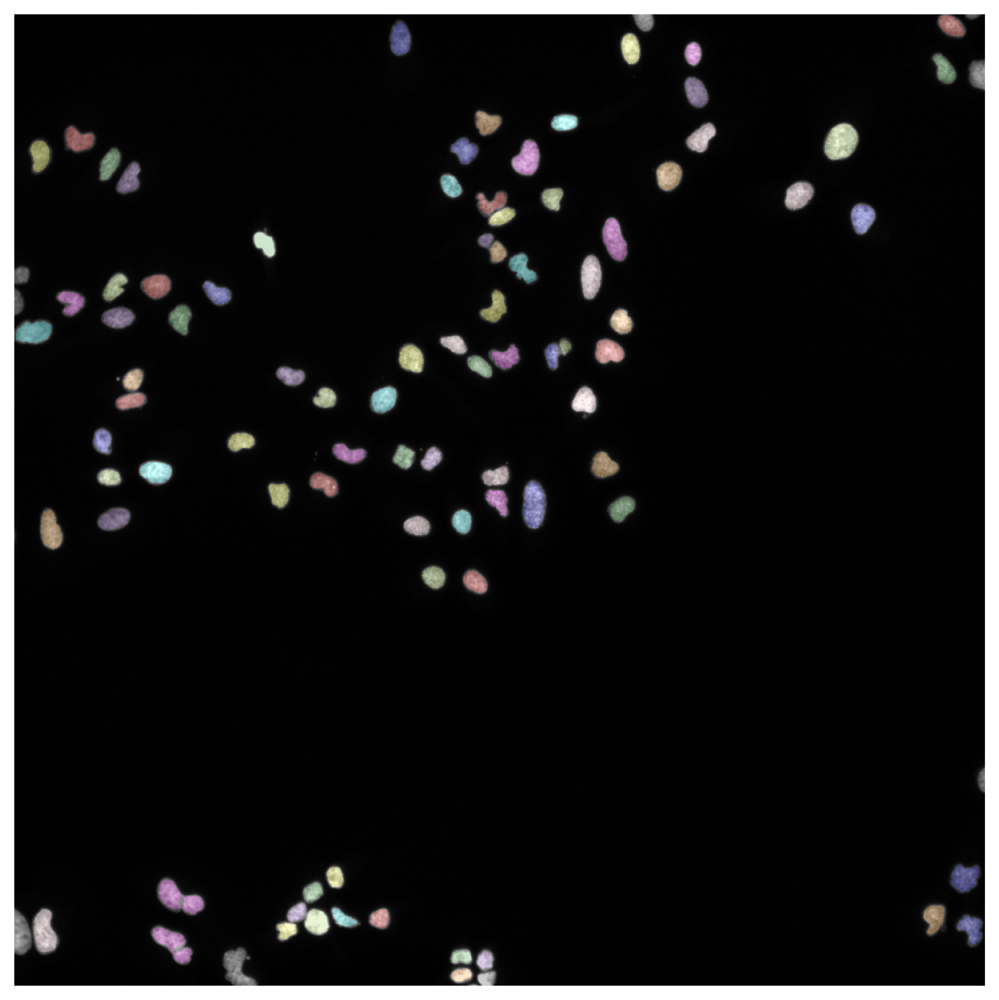

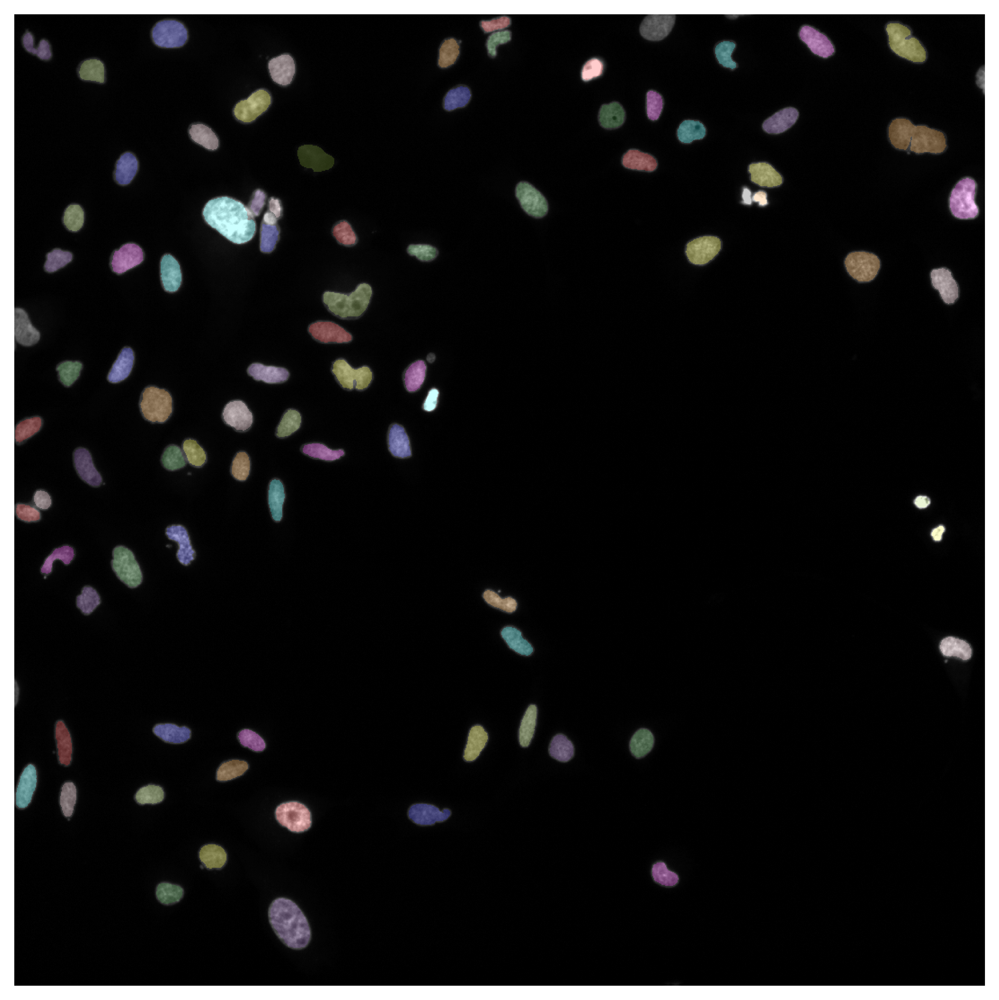

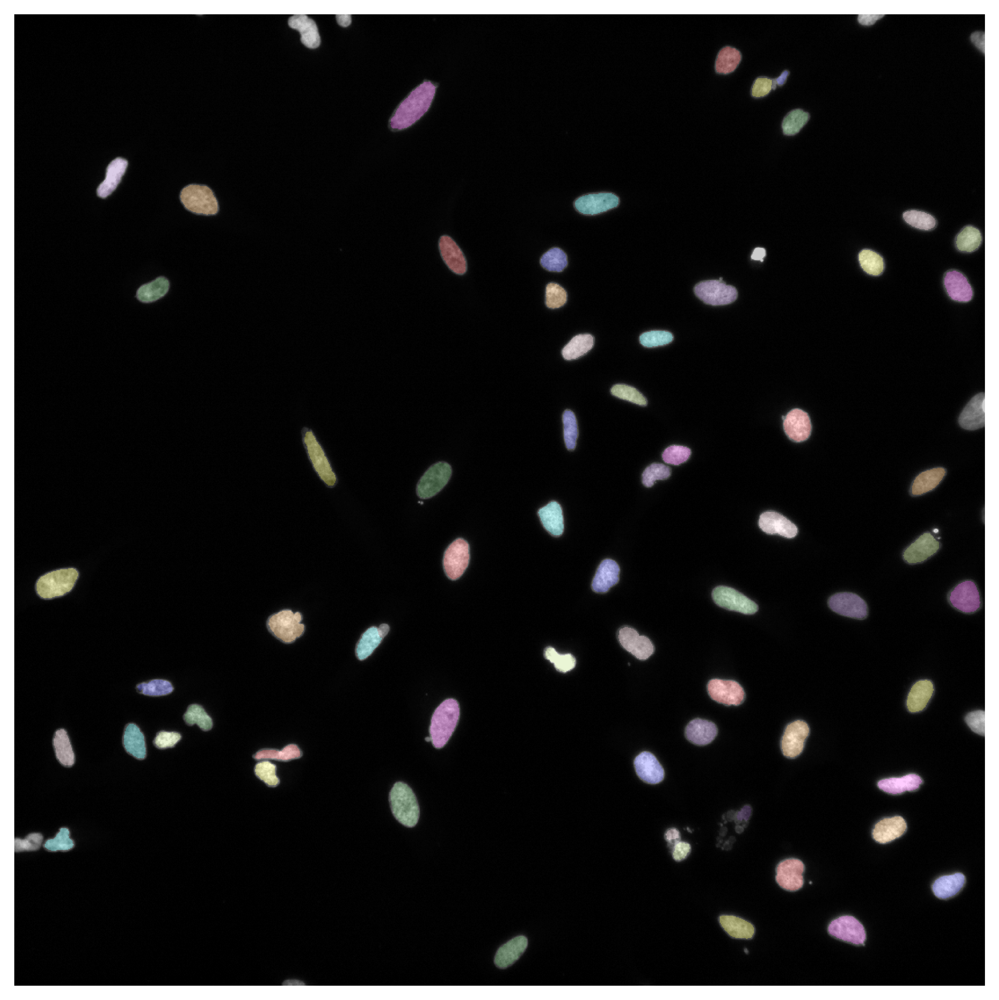

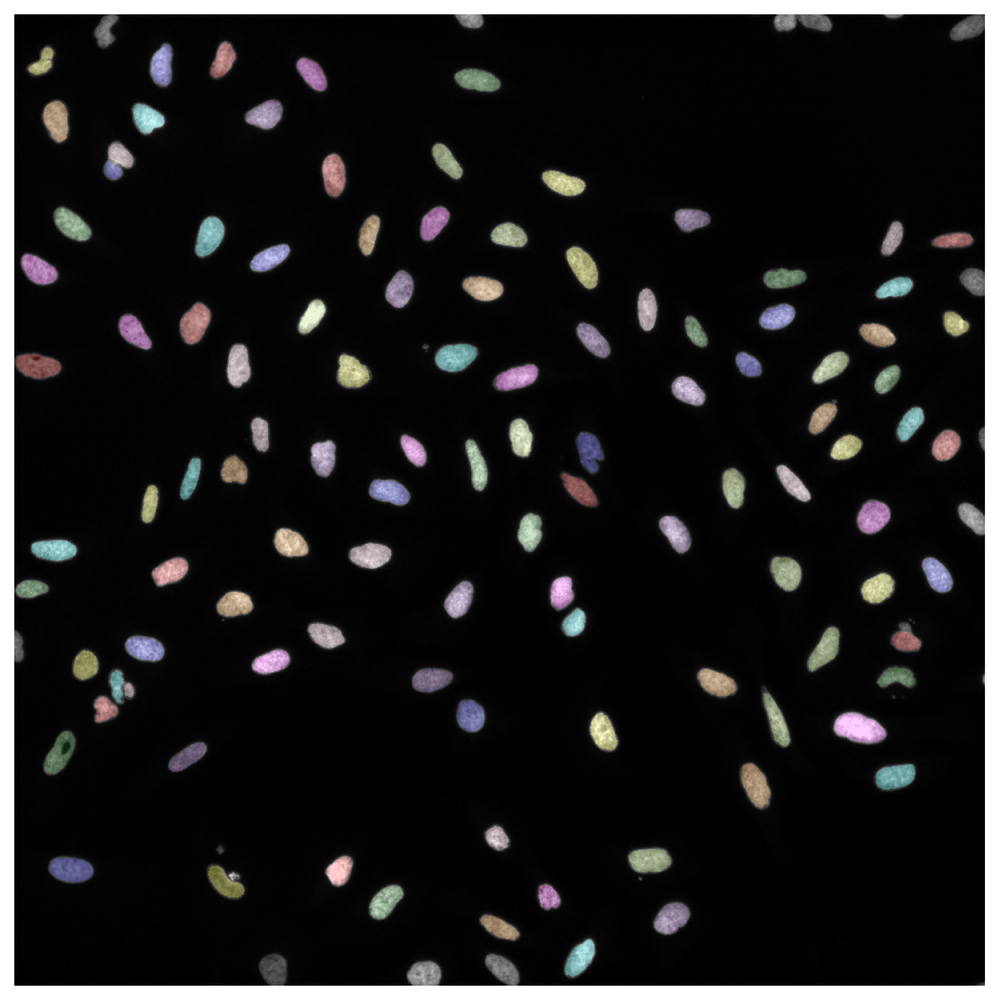

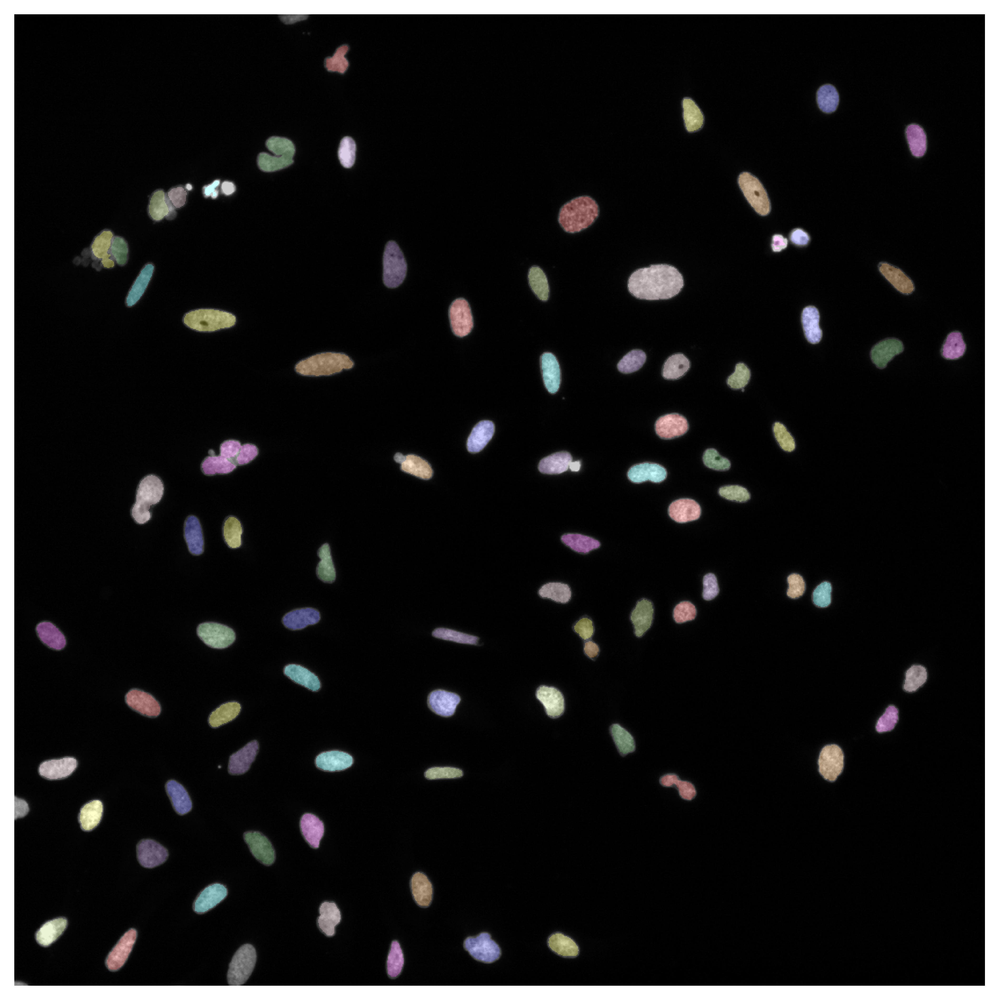

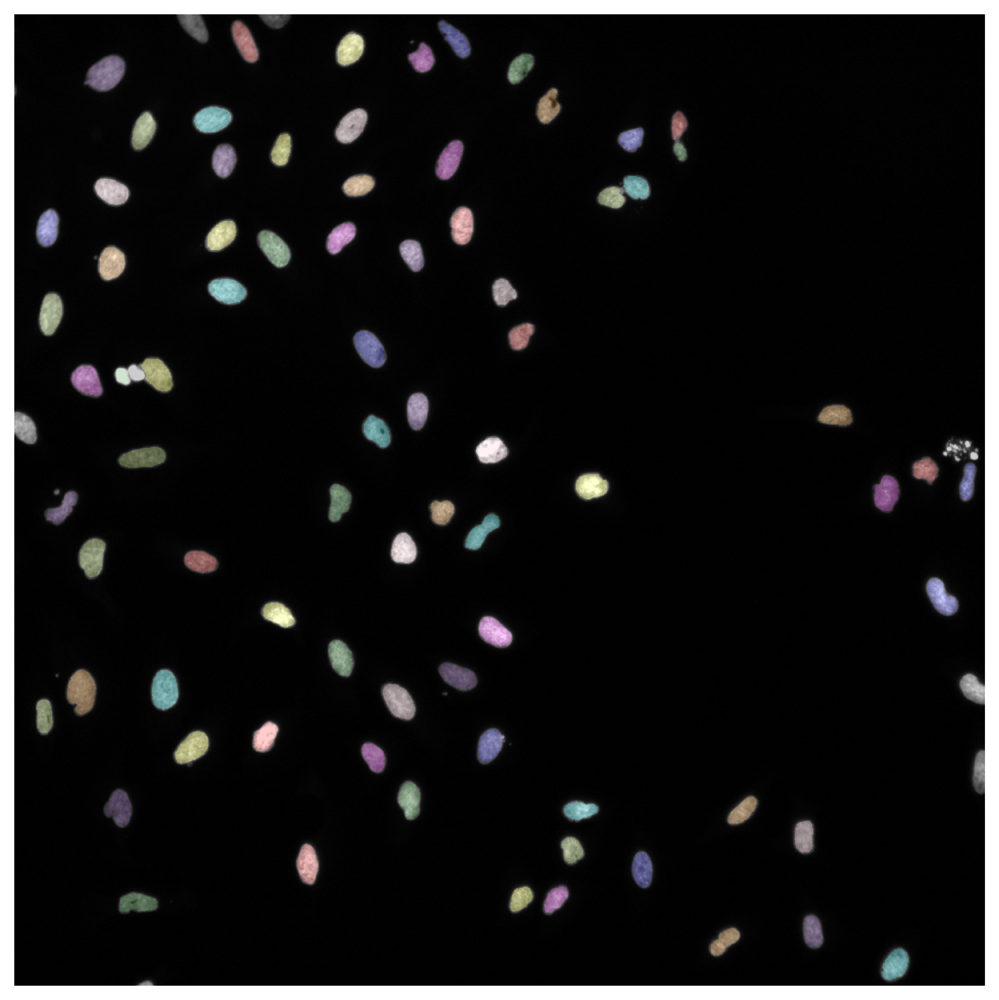

<IPython.core.display.Javascript object>

In [101]:
for label_rgb in label_rgbs:
    fig, ax = plt.subplots(figsize=[9, 9])
    ax.imshow(label_rgb)
    ax.axis("off")

---

## 3. Visualization of the nuclear heterogeneity

We will now use the segmented nuclei and plot for the same 6 targets a random subset of the segmented nuclei from all different field of views and plates to visualize the heterogeneity within a single OE condition and between those.

In [97]:
np.random.seed(seed + 1)
nuclei_loc_dict = {}
for target in selected_targets:
    target_md = md.loc[md.gene_symbol == target]
    sample_idc = np.random.choice(list(range(len(target_md))), size=36, replace=False)
    sample_md = target_md.iloc[sample_idc]
    nuclei_loc_dict[target] = np.array(
        sample_md[["plate", "image_file"]].apply(
            lambda row: "/".join(row.values.astype(str)), axis=1
        )
    )

<IPython.core.display.Javascript object>

JUN


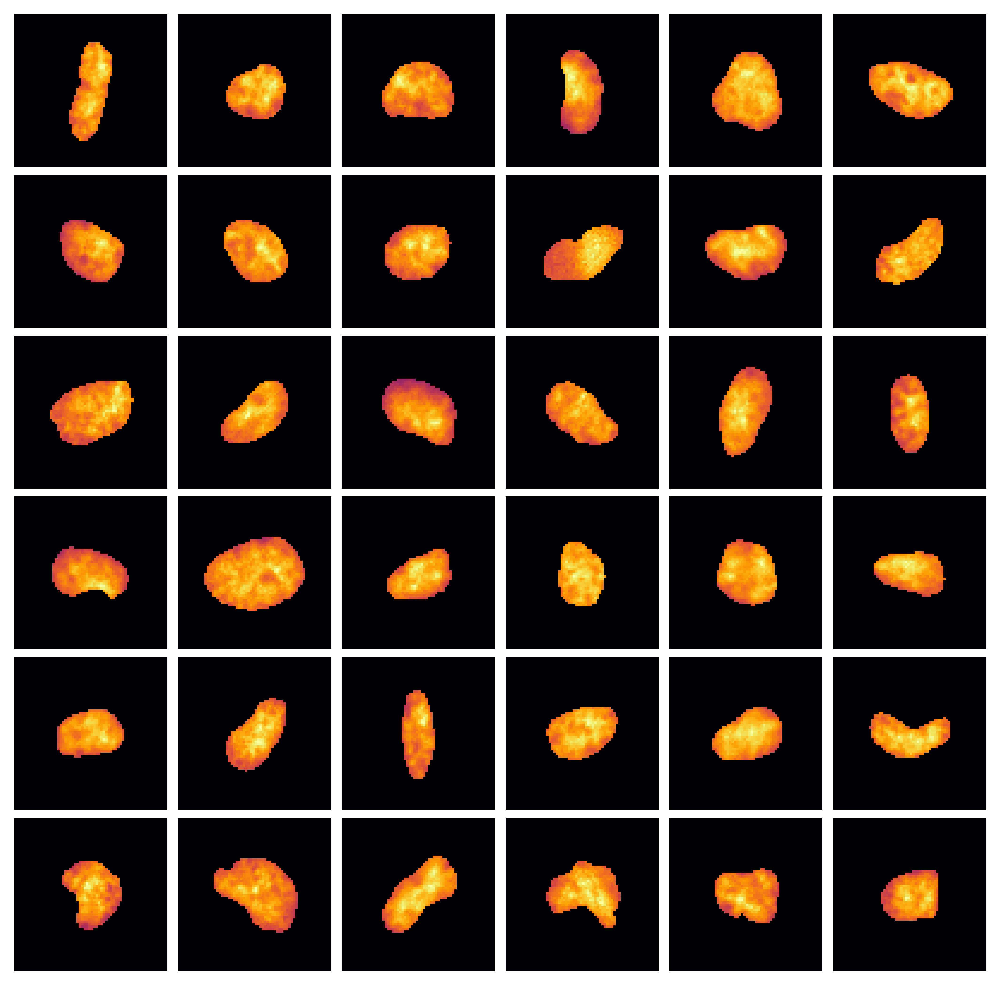

MAP3K9


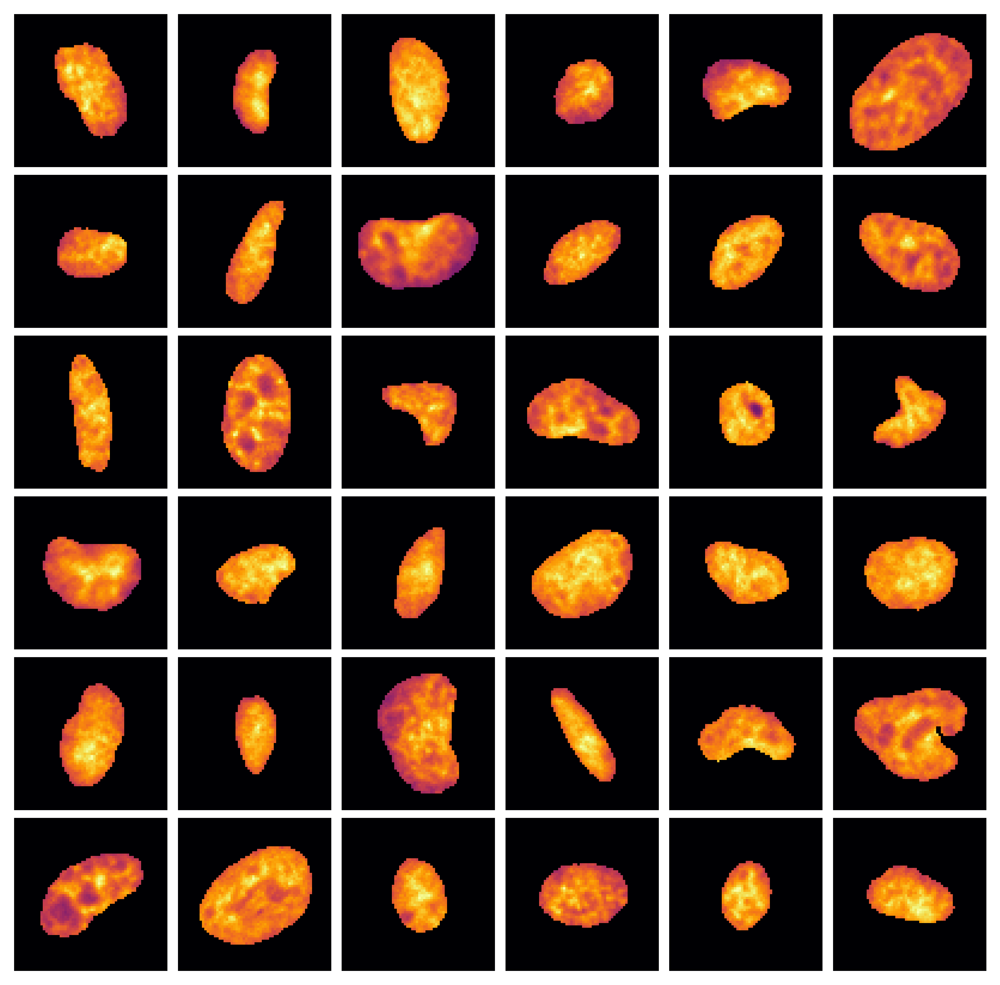

AKT2


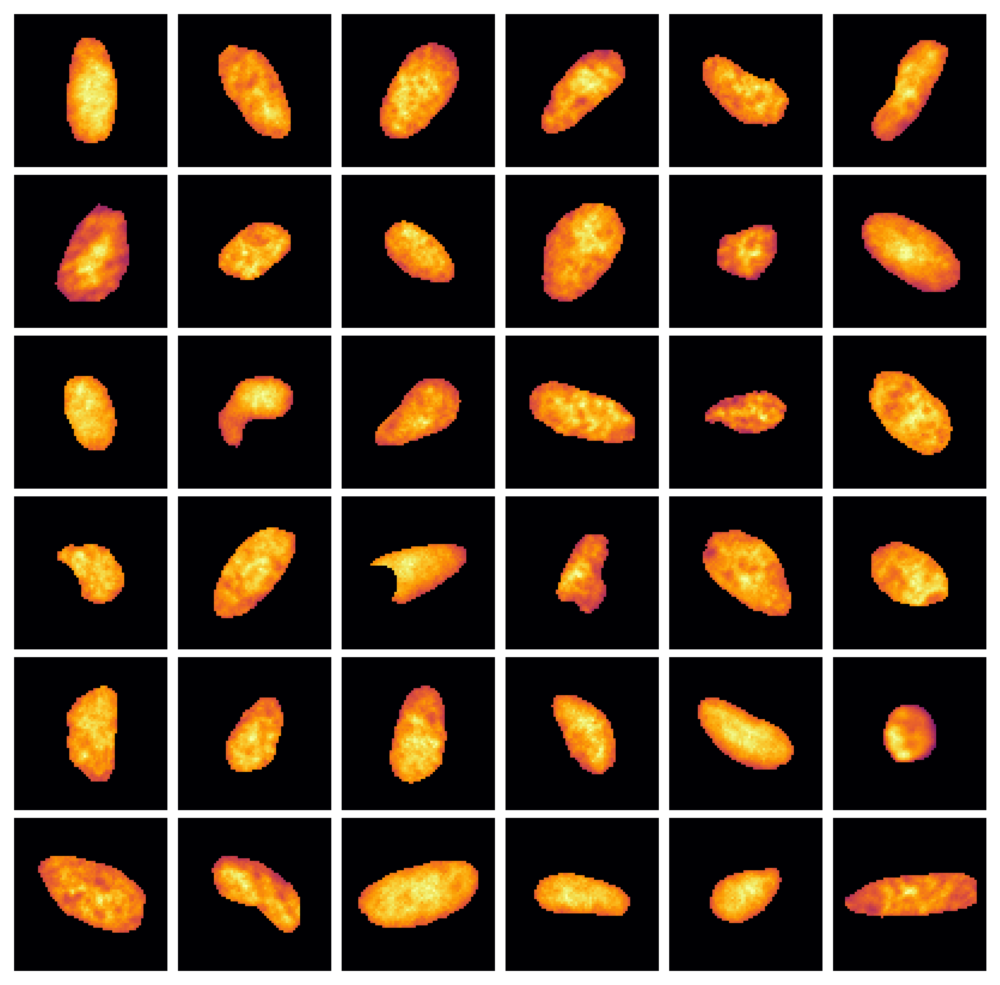

JAK2


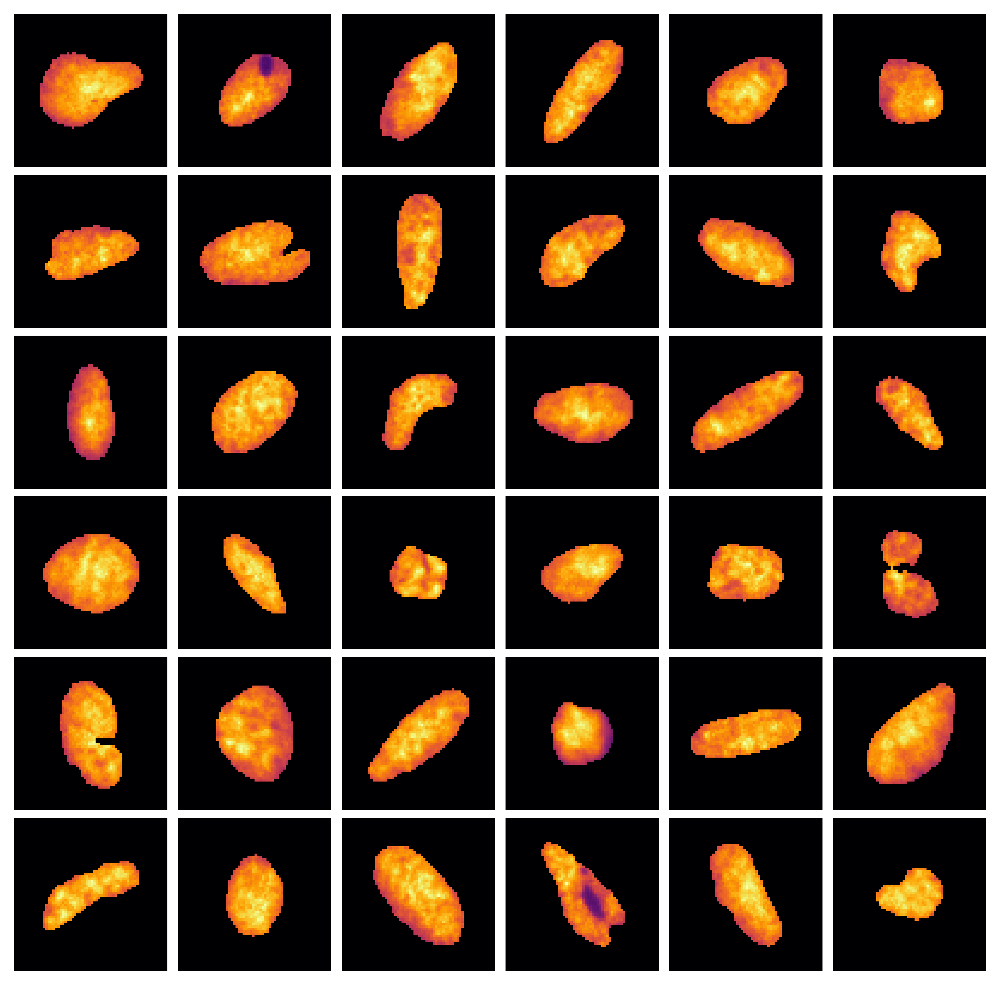

NFKBIB


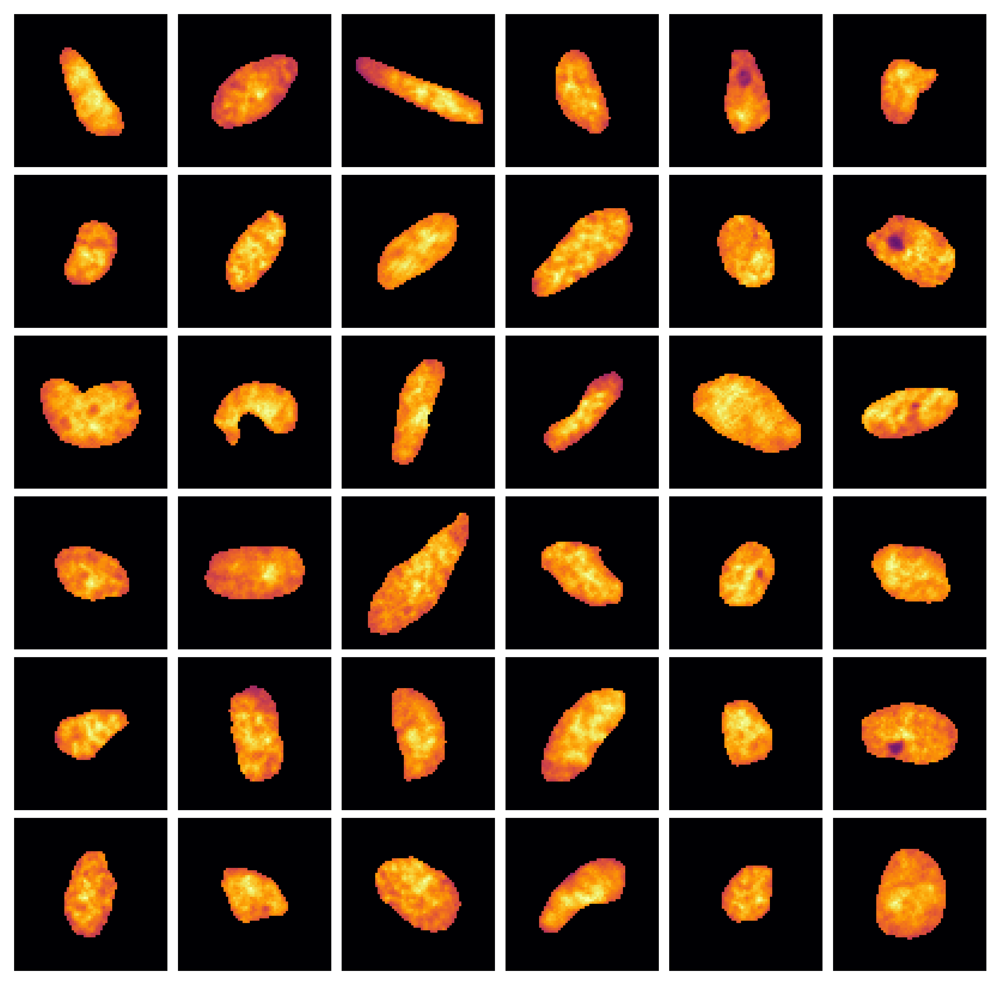

EMPTY


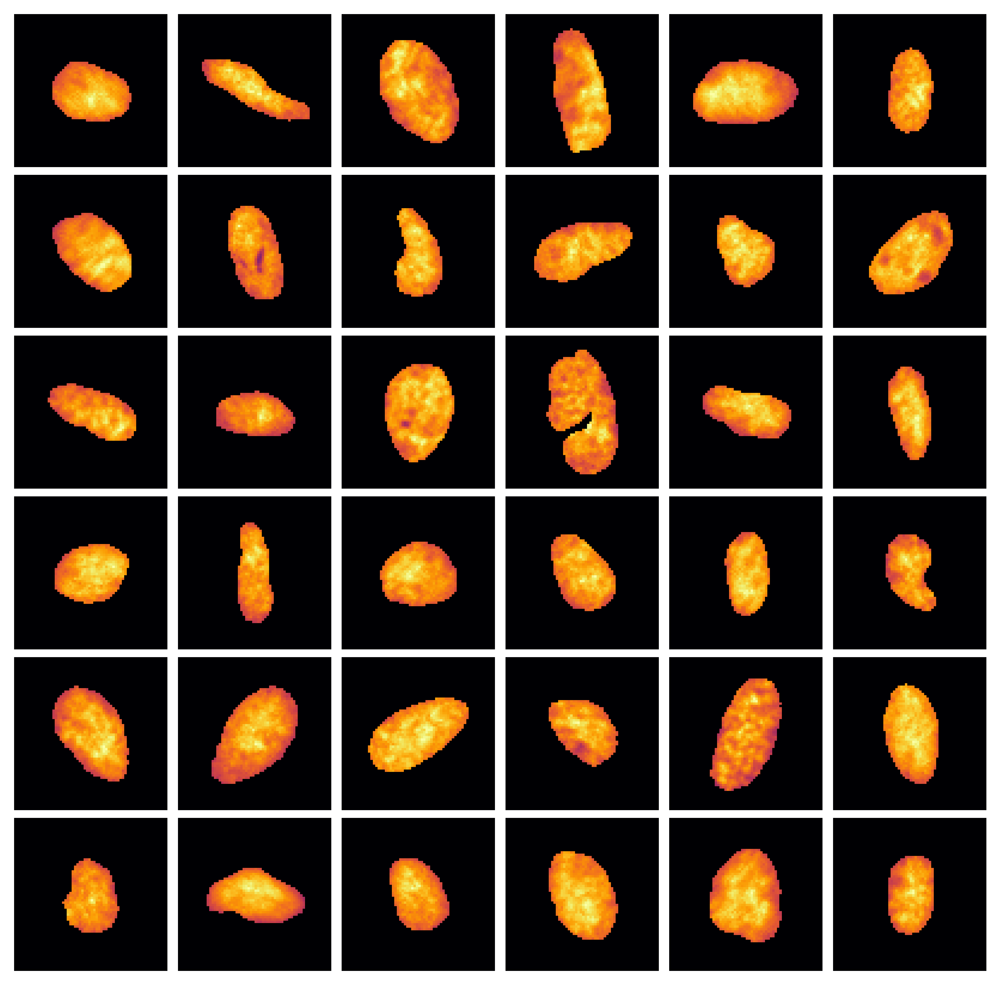

<IPython.core.display.Javascript object>

In [98]:
root_nuclei_dir = (
    "../../../data/experiments/image_preprocessing/full_pipeline/padded_nuclei/"
)
for target in selected_targets:
    print(target)
    fig, ax = plt.subplots(figsize=[9, 9], nrows=6, ncols=6)
    ax = ax.flatten()
    image_locs = nuclei_loc_dict[target]
    for i in range(len(image_locs)):
        image_loc = image_locs[i]
        image = imread(os.path.join(root_nuclei_dir, image_loc))
        image = image - image.min()
        image = image / image.max()
        image = np.clip(image * 255.0, 0, 255).astype(np.uint8)
        ax[i].imshow(image, cmap="inferno")
        ax[i].axis("off")
        # ax[i].set_aspect("equal")
    plt.subplots_adjust(wspace=0, hspace=0.05)
    plt.show()
    plt.close()